# Weekly activity
1. Rotate image by 45 degrees without cropping the sides of the image. (Hint: There are 2 strategies to tackle these problems). Use _"lena.jfif"_ as the input image.
    - Use external libraries `imutils`.  
    - Modify the transformation matrix.
2. Use the images with titles: _"flower.jfif"_ and _"native-bee.png"_. I want to put flower above an image. If I add two images, it will change color. If I blend it, I get a transparent effect. But I want it to be opaque. If it was a rectangular region, we could use the ROI as we did in the previous section. But flower is not a rectangular region. This is where bitwise operations, like AND, OR, NOT and XOR really come in handy. The associated functions are `cv.bitwise_and()`, `cv.bitwise_or()` and `cv.bitwise_not()`. You need to use `cv.threshold` function to segment the flower. Please refer to [online documentation](https://docs.opencv.org/4.x/d0/d86/tutorial_py_image_arithmetics.html) for more info. The result should resemble the following:  
![bee and flowers](img_embed/activity3.PNG "bee_flower")
3. Write a function that randomly crop the central region of an image. The method signature should be as shown in the following:
```
random_center_crop(image, min_crop_ratio, max_crop_ratio)
```

4. Aside from Gaussian noise, name another common type of noise. Write the code to demonstrate how the noise can be included in an image.

In [8]:
#Ans for 1)
import cv2
import imutils
import numpy as np

# Load the image
image = cv2.imread('lena.jfif')

# Calculate the diagonal of the image to determine the required padding
(diagonal_length, _) = image.shape[:2]
diagonal = int(np.sqrt(2) * diagonal_length)

# Create a new padded image
padded_image = np.zeros((diagonal, diagonal, 3), dtype=np.uint8)

# Calculate the center position
center_x = (diagonal - image.shape[1]) // 2
center_y = (diagonal - image.shape[0]) // 2

# Place the original image in the center of the padded image
padded_image[center_y:center_y + image.shape[0], center_x:center_x + image.shape[1]] = image

# Rotate the padded image
rotated_image = imutils.rotate_bound(padded_image, 45)

# Display the result
cv2.imshow('Rotated Image - Padded', rotated_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


# Output of Ans 1)
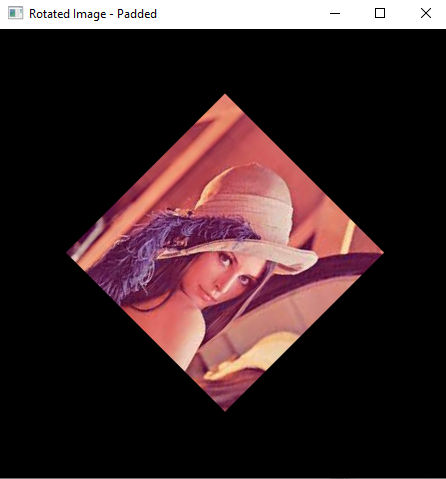

In [ ]:
#Ans for Q2
import cv2
import numpy as np

# Load the images
flower = cv2.imread('flower.jfif')
bee = cv2.imread('native-bee.png')

# Resize the flower image to fit onto the bee image
flower_height, flower_width = flower.shape[:2]
bee_height, bee_width = bee.shape[:2]
scale_factor = min(bee_width / flower_width, bee_height / flower_height)
new_flower_size = (int(flower_width * scale_factor), int(flower_height * scale_factor))
flower_resized = cv2.resize(flower, new_flower_size)

# Create a mask of the flower
flower_gray = cv2.cvtColor(flower_resized, cv2.COLOR_BGR2GRAY)
_, mask = cv2.threshold(flower_gray, 1, 255, cv2.THRESH_BINARY)

# Create an inverse mask
mask_inv = cv2.bitwise_not(mask)

# Define the position to overlay the flower on the bee image
x_offset = (bee_width - new_flower_size[0]) // 2
y_offset = (bee_height - new_flower_size[1]) // 2

# Extract the region of interest (ROI) from the bee image
roi = bee[y_offset:y_offset + new_flower_size[1], x_offset:x_offset + new_flower_size[0]]

# Black-out the area of the flower in the ROI
bee_bg = cv2.bitwise_and(roi, roi, mask=mask_inv)

# Take only the region of the flower from the flower image
flower_fg = cv2.bitwise_and(flower_resized, flower_resized, mask=mask)

# Combine the bee background and flower foreground
combined = cv2.add(bee_bg, flower_fg)

# Place the combined image back into the original bee image
bee[y_offset:y_offset + new_flower_size[1], x_offset:x_offset + new_flower_size[0]] = combined

# Display the result
cv2.imshow('Result', bee)
cv2.waitKey(0)
cv2.destroyAllWindows()


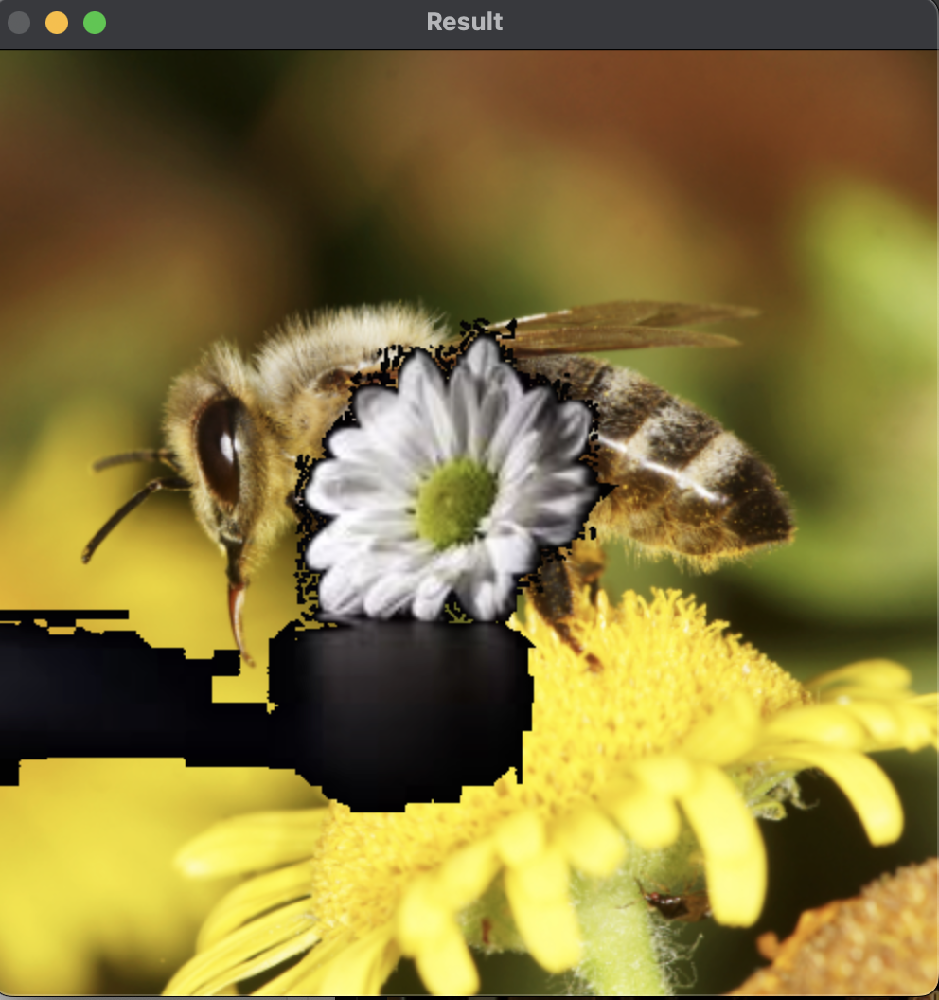

In [ ]:
#Ans for Q3
import cv2 as cv
import random
def random_center_crop(image, min_crop_ratio, max_crop_ratio):
    """
    Randomly crops the central region of an image.
    
    Args:
    image (numpy.ndarray): The input image.
    min_crop_ratio (float): The minimum ratio of the crop size to the original image size.
    max_crop_ratio (float): The maximum ratio of the crop size to the original image size.
    
    Returns:
    numpy.ndarray: The cropped image.
    """
    if not (0 < min_crop_ratio <= max_crop_ratio <= 1):
        raise ValueError("Crop ratios must be between 0 and 1, and min_crop_ratio <= max_crop_ratio.")
    
    height, width, _ = image.shape
    
    # Randomly choose a crop ratio between min_crop_ratio and max_crop_ratio
    crop_ratio = random.uniform(min_crop_ratio, max_crop_ratio)
    
    # Calculate the dimensions of the cropped region
    crop_height = int(height * crop_ratio)
    crop_width = int(width * crop_ratio)
    
    # Calculate the coordinates of the top-left corner of the cropped region
    start_y = (height - crop_height) // 2
    start_x = (width - crop_width) // 2
    
    # Crop the image
    cropped_image = image[start_y:start_y + crop_height, start_x:start_x + crop_width]
    
    return cropped_image

# Example usage:
img_path = 'car.jpg'
image = cv.imread(img_path)
if image is not None:
    cropped_image = random_center_crop(image, 0.5, 0.8)
    cv.imshow("Original Image", image)
    cv.imshow("Cropped Image", cropped_image)
    cv.waitKey(0)
    cv.destroyAllWindows()
else:
    print("Error: Image not loaded. Check the path and file.")

2024-07-26 23:47:21.584 Python[83312:3829219] WARNING: Secure coding is not enabled for restorable state! Enable secure coding by implementing NSApplicationDelegate.applicationSupportsSecureRestorableState: and returning YES.


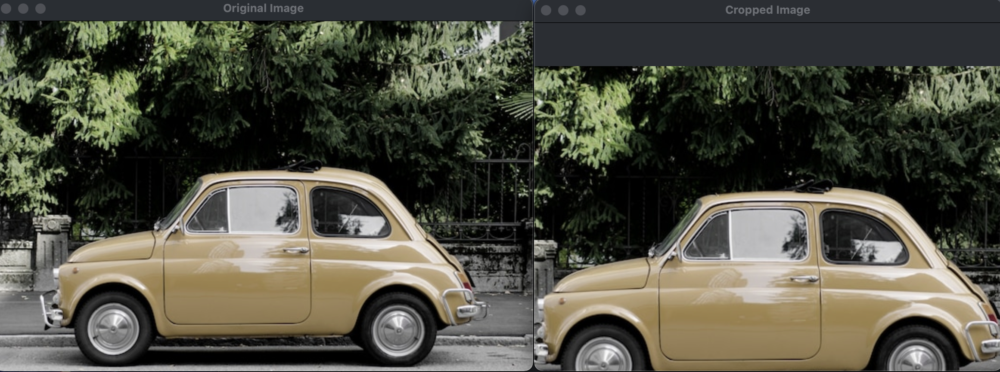

#### Q4 Ans:

Another common type of noise in images is Salt-and-Pepper Noise. This type of noise is characterized by randomly occurring white and black pixels. Here's the code demonstrating it.

In [ ]:
import cv2 as cv
import numpy as np

def add_salt_and_pepper_noise(image, salt_prob, pepper_prob):
    """
    Adds salt and pepper noise to an image.
    
    Args:
    image (numpy.ndarray): The input image.
    salt_prob (float): Probability of adding salt (white) noise.
    pepper_prob (float): Probability of adding pepper (black) noise.
    
    Returns:
    numpy.ndarray: The image with salt and pepper noise added.
    """
    noisy_image = image.copy()
    height, width, _ = image.shape

    # Salt noise
    num_salt = np.ceil(salt_prob * image.size).astype(int)
    salt_coords = [np.random.randint(0, i, num_salt) for i in image.shape]
    noisy_image[salt_coords[0], salt_coords[1], :] = 1

    # Pepper noise
    num_pepper = np.ceil(pepper_prob * image.size).astype(int)
    pepper_coords = [np.random.randint(0, i, num_pepper) for i in image.shape]
    noisy_image[pepper_coords[0], pepper_coords[1], :] = 0

    return noisy_image

# Example usage:
img_path = 'alley_night.jpg'
image = cv.imread(img_path)
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)  # Convert to RGB

if image is not None:
    salt_prob = 0.02
    pepper_prob = 0.02
    noisy_image = add_salt_and_pepper_noise(image, salt_prob, pepper_prob)

    # Display the images
    cv.imshow("Original Image", cv.cvtColor(image, cv.COLOR_RGB2BGR))
    cv.imshow("Noisy Image", cv.cvtColor(noisy_image, cv.COLOR_RGB2BGR))
    cv.waitKey(0)
    cv.destroyAllWindows()
else:
    print("Error: Image not loaded. Check the path and file.")


2024-07-26 23:44:17.847 Python[83226:3825207] WARNING: Secure coding is not enabled for restorable state! Enable secure coding by implementing NSApplicationDelegate.applicationSupportsSecureRestorableState: and returning YES.


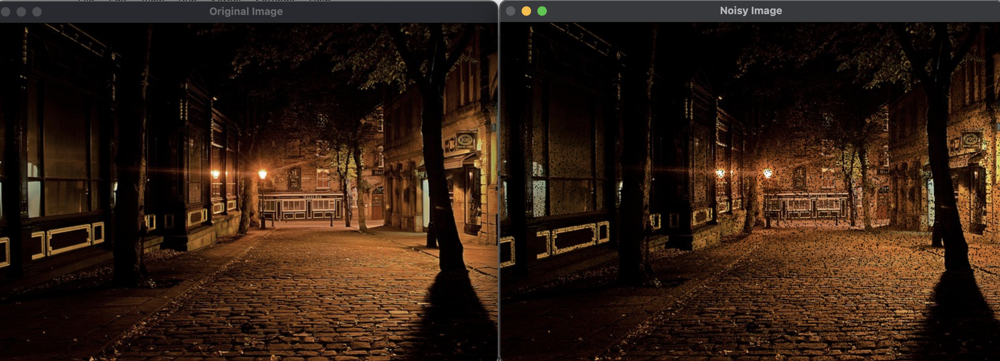